In [1]:
energy_threshold = 'results1GeVSparseEnergyBins'

In [2]:
!ls -1 /lfs/l2/hawc/users/vikasj78/J1809-193_Analysis/fermi/data/*PH*.fits > ../results1GeVSparseEnergyBins/ft1.txt

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import fermipy
from fermipy.plotting import plot_markers
from astropy.coordinates import SkyCoord
from fermipy.plotting import ROIPlotter
from importlib import reload

In [4]:
reload(fermipy.plotting)
from fermipy.plotting import ROIPlotter

In [5]:
plots_dir = f'../{energy_threshold}/plots/'

In [6]:
#best fit hess components locations 
hess_comp1_ra = 272.551 #deg
hess_comp1_dec = -19.344 #deg
hess_comp1_sigma = 0.622 #semi-major axis deg
hess_comp1_ecc = 0.824
hess_comp1_position_angle = 50.0 #deg

hess_comp2_ra = 272.400 #deg
hess_comp2_dec = -19.406 #deg
hess_comp2_sigma = 0.0953 #deg

In [7]:
# Some coordinates
pos_psr_j1809_1917 = SkyCoord((18.+9./60+43.147/3600)*15, -19.-17./60-38.1/3600, unit='deg', frame='icrs')
pos_psr_j1811_1925 = SkyCoord((18.+11./60+29.15/3600)*15, -19.-25./60-25.4/3600, unit='deg', frame='icrs')

pos_snr_g011d0_00d0 = SkyCoord(18.1663*15, -19.4160, unit='deg', frame='icrs')
rad_snr_g011d0_00d0 = 0.0919

pos_snr_g011d1_00d1 = SkyCoord(18.1612*15, -19.2012, unit='deg', frame='icrs')
rad_snr_g011d1_00d1 = 0.1018

pos_snr_g011d2_0d3 = SkyCoord((18.+11./60+28.9/3600)*15, -19.-25./60-29./3600, unit='deg', frame='icrs')
rad_snr_g011d2_0d3 = 0.5 * 4.33 / 60
pos_xte_j1810_197 = SkyCoord((18.+9./60+51.07/3600)*15, -19.-43./60-51.8/3600, unit='deg', frame='icrs')

hess_comp1 = SkyCoord(hess_comp1_ra, hess_comp1_dec, unit='deg', frame='icrs')
hess_comp2 = SkyCoord(hess_comp2_ra, hess_comp2_dec, unit='deg', frame='icrs')
rad_hess_comp2 = hess_comp2_sigma

In [8]:
def plot_psr_snr(pl):
    plot_markers(pos_psr_j1809_1917.ra.deg, pos_psr_j1809_1917.dec.deg,marker='v',color='green', label='PSR J1809-1917')
    plot_markers(pos_psr_j1811_1925.ra.deg, pos_psr_j1811_1925.dec.deg,marker='v',color='blue', label='PSR J1811-1925')
    plot_markers(hess_comp1.ra.deg, hess_comp1.dec.deg, marker='o', color='magenta', label = 'HESS Comp 1')
    plot_markers(hess_comp2.ra.deg, hess_comp2.dec.deg, marker='o', color='springgreen', label = 'HESS Comp 2')
    pl.draw_circle(skydir=hess_comp2,radius=rad_hess_comp2,edgecolor='springgreen',linewidth=2,linestyle='-')
    pl.draw_circle(skydir=pos_snr_g011d0_00d0,radius=rad_snr_g011d0_00d0,edgecolor='cyan',linewidth=2,linestyle='-')
    pl.draw_circle(skydir=pos_snr_g011d1_00d1,radius=rad_snr_g011d1_00d1,edgecolor='cyan',linewidth=2,linestyle='-')
    pl.draw_circle(skydir=pos_snr_g011d2_0d3,radius=rad_snr_g011d2_0d3,edgecolor='cyan',linewidth=2,linestyle='-')

In [9]:
levels_wo_source = [-5,-3,3,5,7,9]
levels_with_source = [-5,-3,3,5,7,9,11,13,15]

In [10]:
def plot_sig_ex_maps(map_obj, levels, name):
    o = map_obj
    fig = plt.figure(figsize=(14,6))
    sig = ROIPlotter(o['sigma'],roi=gta.roi)
    sig.plot(vmin=-5,vmax=5,levels=levels,subplot=121,cmap='RdBu_r',zoom=8)
    plot_psr_snr(sig)
    plt.gca().set_title('Significance')
    plt.legend(ncol=2,loc='upper center', bbox_to_anchor=(0.5, 1.24))
    ex = ROIPlotter(o['excess'],roi=gta.roi)
    ex.plot(vmin=-200,vmax=2000,subplot=122,cmap='RdBu_r',zoom=8)
    plot_psr_snr(ex)
    plt.gca().set_title('Excess Counts')
    plt.legend(ncol=2,loc='upper center', bbox_to_anchor=(0.5, 1.24))
    plt.savefig(plots_dir + f"{name}.png",bbox_inches='tight')
    plt.savefig(plots_dir + f"{name}.pdf",bbox_inches='tight')

In [11]:
def plot_extension(ext_obj, name):
    plt.figure(figsize=(8,6))
    plt.plot(ext_obj['width'],ext_obj['dloglike'],marker='o')
    plt.gca().set_xlabel('Width [deg]')
    plt.gca().set_ylabel('Delta Log-Likelihood')
    plt.gca().axvline(ext_obj['ext'])
    plt.gca().axvspan(ext_obj['ext']-ext_obj['ext_err_lo'],ext_obj['ext']+ext_obj['ext_err_hi'],
                          alpha=0.2,label='This Measurement',color='b')

    plt.gca().axvline(0.5,color='k')
    plt.gca().axvspan(0.5-0.15,0.5+0.15,alpha=0.2,label='Araya et. al. 2018',color='k')
    plt.gca().set_ylim(0.0,80)
    plt.gca().set_xlim(0.25,0.75)

    plt.annotate('TS$_{\mathrm{ext}}$ = %.2f\nR$_{68}$ = %.3f $\pm$ %.3f'%
                (ext_obj['ts_ext'],ext_obj['ext'],ext_obj['ext_err']),xy=(0.05,0.05),xycoords='axes fraction')
    plt.gca().legend(frameon=False)
    plt.savefig(plots_dir + f"{name}.png",bbox_inches='tight')
    plt.savefig(plots_dir + f"{name}.pdf",bbox_inches='tight')

In [12]:
def plot_spectrum(result_name, sed, source_name):
    c = np.load(f'../{energy_threshold}/{result_name}.npy',allow_pickle=True).flat[0]
    E = np.array(c['sources'][source_name]['model_flux']['energies'])
    dnde = np.array(c['sources'][source_name]['model_flux']['dnde'])
    dnde_hi = np.array(c['sources'][source_name]['model_flux']['dnde_hi'])
    dnde_lo = np.array(c['sources'][source_name]['model_flux']['dnde_lo'])
    uplim_mask = sed['ts'] > 2
    plt.loglog(E, (E**2)*dnde, 'k--')
    plt.loglog(E, (E**2)*dnde_hi, 'k')
    plt.loglog(E, (E**2)*dnde_lo, 'k')
    plt.errorbar(sed['e_ctr'][uplim_mask],
                 sed['e2dnde'][uplim_mask], 
                 yerr=sed['e2dnde_err'][uplim_mask], fmt ='o')
    plt.errorbar(np.array(sed['e_ctr'][~uplim_mask]),
             sed['e2dnde_ul95'][~uplim_mask], yerr=0.2*sed['e2dnde_ul95'][~uplim_mask], 
                 fmt='o', uplims=True)
    plt.xlabel('E [MeV]')
    plt.ylabel(r'E$^{2}$ dN/dE [MeV cm$^{-2}$ s$^{-1}$]')
    source_name = source_name.replace(" ", "_")
    plt.savefig(plots_dir + f"spectrum_{result_name}_{source_name}.png",bbox_inches='tight')
    plt.savefig(plots_dir + f"spectrum_{result_name}_{source_name}.pdf",bbox_inches='tight')

In [13]:
from fermipy.gtanalysis import GTAnalysis
gta = GTAnalysis(f'../{energy_threshold}/config.yaml',logging={'verbosity': 3})
matplotlib.interactive(True)

2022-08-04 08:04:14 INFO    GTAnalysis.__init__(): 
--------------------------------------------------------------------------------
fermipy version v1.1.5 
ScienceTools version 2.2.0


In [14]:
gta.compute_drm(overwrite=True)

2022-08-04 08:04:23 INFO    GTBinnedAnalysis._drm_app(): Computing drm for component 00.
2022-08-04 08:04:23 INFO    GTBinnedAnalysis.run_gtapp(): Running gtdrm.
2022-08-04 08:04:23 INFO    GTBinnedAnalysis.run_gtapp(): time -p gtdrm cmap=/lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/ccube_00.fits outfile=/lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/drm_00.fits irfs="P8R3_SOURCE_V2" evtype=3 expcube=/lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/ltcube_00.fits bexpmap=/lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/bexpmap_00.fits edisp_bins=1 wmap=none convol=yes resample=yes rfactor=2 minbinsz=0.1 ptsrc=yes psfcorr=yes chatter=2 clobber=yes debug=no gui=no mode="ql"
2022-08-04 08:04:23 INFO    GTBinnedAnalysis.run_gtapp(): 
2022-08-04 08:04:24 INFO    GTBinnedAnalysis.r

In [15]:
gta.setup()

2022-08-04 08:04:31 INFO    GTAnalysis.setup(): Running setup.
2022-08-04 08:04:31 INFO    GTBinnedAnalysis.setup(): Running setup for component 00
2022-08-04 08:04:31 INFO    GTBinnedAnalysis._select_data(): Skipping data selection.
2022-08-04 08:04:31 INFO    GTBinnedAnalysis._create_ltcube(): Skipping LT Cube.
2022-08-04 08:04:31 INFO    GTBinnedAnalysis._create_expcube(): Skipping gtexpcube.
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 54682.655289 from DATE-OBS.
Set MJD-END to 59214.000000 from DATE-END'. [astropy.wcs.wcs]
2022-08-04 08:04:33 INFO    GTBinnedAnalysis._create_srcmaps(): Skipping gtsrcmaps.
2022-08-04 08:04:33 INFO    GTBinnedAnalysis.setup(): Finished setup for component 00
2022-08-04 08:04:33 INFO    GTBinnedAnalysis._create_binned_analysis(): Creating BinnedAnalysis for component 00.


Drm_Cache::update Measured counts < 0 4FGL J1737.6-2350 14 -5.24262e-12 3.48683e-11
1.32794 0.364343 0.0870916 0.0180775 0.00348245 0.000703367 0.000158848 3.69041e-05 7.35541e-06 1.20161e-06 1.64438e-07 1.96674e-08 2.2776e-09 2.60254e-10 3.48683e-11 


2022-08-04 08:04:44 INFO    GTAnalysis.setup(): Initializing source properties
2022-08-04 08:04:51 INFO    GTAnalysis.setup(): Finished setup.


Filename: ../results1GeVSparseEnergyBins/ccube_00.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     135   (100, 100, 15)   int32   
  1  EBOUNDS       1 BinTableHDU     43   15R x 3C   [I, 1E, 1E]   
  2  GTI           1 BinTableHDU     50   69298R x 2C   [D, D]   


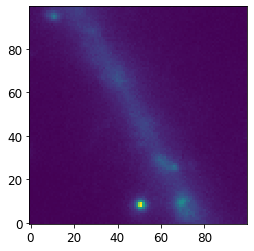

In [16]:
import astropy.io.fits as pyfits

h = pyfits.open(f'../{energy_threshold}/ccube_00.fits')
h.info()
counts = h[0].data
counts.shape
plt.figure()
plt.imshow(np.sum(counts,axis=0),interpolation='nearest',origin='lower')

In [17]:
gta.print_roi()

2022-08-04 08:04:52 INFO    GTAnalysis.print_roi(): 
name                SpatialModel   SpectrumType     offset        ts       npred
--------------------------------------------------------------------------------
4FGL J1810.3-1925e  RadialDisk     LogParabola       0.000       nan      3398.8
4FGL J1811.5-1925   PointSource    PowerLaw          0.280       nan       487.1
4FGL J1808.8-1949c  PointSource    PowerLaw          0.537       nan       720.6
4FGL J1811.5-1844   PointSource    LogParabola       0.741       nan      1577.9
4FGL J1808.2-2028e  RadialDisk     LogParabola       1.166       nan      2671.3
4FGL J1818.1-2000   PointSource    LogParabola       1.921       nan       543.3
4FGL J1813.1-1737e  RadialDisk     LogParabola       1.928       nan      8106.3
4FGL J1804.9-1745   PointSource    PowerLaw          2.109       nan       406.8
4FGL J1806.2-2126   PointSource    LogParabola       2.221       nan      3486.6
4FGL J1818.5-2036   PointSource    PowerLaw          2.2

In [18]:
print(gta.roi['4FGL J1810.3-1925e'])

Name           : 4FGL J1810.3-1925e
Associations   : ['4FGL J1810.3-1925e']
RA/DEC         :    272.590/   -19.430
GLON/GLAT      :     11.048/    -0.118
TS             : nan
Npred          : 3398.84
Flux           : 7.082e-09 +/-      nan
EnergyFlux     : 1.526e-05 +/-      nan
SpatialModel   : RadialDisk
SpectrumType   : LogParabola
Spectral Parameters
b'norm'        :  2.882e-12 +/-   2.89e-13
b'alpha'       :      2.412 +/-     0.1268
b'beta'        :     0.2855 +/-    0.09529
b'Eb'          :       1747 +/-        nan


In [19]:
gta.optimize()

2022-08-04 08:04:52 INFO    GTAnalysis.optimize(): Starting


Joint fit  ['galdiff', '4FGL J1809.8-2332', '4FGL J1801.3-2326e', '4FGL J1826.2-1450', '4FGL J1813.1-1737e']


/lfs/l7/hawc/users/vikasj78/mamba/envs/fermipy/lib/python3.9/site-packages/scipy/interpolate/_fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


Fitting shape galdiff TS: 1526555.880
Fitting shape 4FGL J1809.8-2332 TS:  56259.228
Fitting shape 4FGL J1826.2-1450 TS:   5938.236
Fitting shape 4FGL J1801.3-2326e TS:   3070.881
Fitting shape 4FGL J1803.1-2148 TS:   1854.481
Fitting shape 4FGL J1801.6-2326 TS:   1660.783
Fitting shape 4FGL J1813.1-1737e TS:   1109.832
Fitting shape 4FGL J1804.7-2144e TS:    706.863
Fitting shape 4FGL J1827.4-1445 TS:    527.132
Fitting shape 4FGL J1806.2-2126 TS:    492.038
Fitting shape 4FGL J1833.6-2103 TS:    489.107
Fitting shape 4FGL J1818.6-1533 TS:    406.691
Fitting shape isodiff TS:    374.096
Fitting shape 4FGL J1805.6-2136e TS:    340.213
Fitting shape 4FGL J1830.7-1634 TS:    324.600
Fitting shape 4FGL J1817.1-1742 TS:    256.177
Fitting shape 4FGL J1820.4-1609c TS:    239.668
Fitting shape 4FGL J1810.3-1925e TS:    225.262
Fitting shape 4FGL J1800.9-2407 TS:    212.296
Fitting shape 4FGL J1759.7-2141 TS:    181.460
Fitting shape 4FGL J1801.8-2358 TS:    176.717
Fitting shape 4FGL J1819.9

2022-08-04 08:09:40 INFO    GTAnalysis.optimize(): Finished
2022-08-04 08:09:40 INFO    GTAnalysis.optimize(): LogLike: 1787691.360887 Delta-LogLike: 2352.572288
2022-08-04 08:09:40 INFO    GTAnalysis.optimize(): Execution time: 288.73 s


{'loglike0': 1785338.7885997044,
 'loglike1': 1787691.3608873184,
 'dloglike': 2352.5722876139916,
 'config': {'npred_threshold': 1.0,
  'npred_frac': 0.95,
  'shape_ts_threshold': 25.0,
  'max_free_sources': 5,
  'skip': [],
  'optimizer': {'optimizer': 'MINUIT',
   'tol': 0.001,
   'max_iter': 100,
   'init_lambda': 0.0001,
   'retries': 3,
   'min_fit_quality': 2,
   'verbosity': 0}}}

In [20]:
gta.print_roi()

2022-08-04 08:09:40 INFO    GTAnalysis.print_roi(): 
name                SpatialModel   SpectrumType     offset        ts       npred
--------------------------------------------------------------------------------
4FGL J1810.3-1925e  RadialDisk     LogParabola       0.000    276.22      3976.8
4FGL J1811.5-1925   PointSource    PowerLaw          0.280     42.98       624.9
4FGL J1808.8-1949c  PointSource    PowerLaw          0.537     56.67      1105.6
4FGL J1811.5-1844   PointSource    LogParabola       0.741    102.66      1424.0
4FGL J1808.2-2028e  RadialDisk     LogParabola       1.166    103.42      2458.9
4FGL J1818.1-2000   PointSource    LogParabola       1.921     85.66       520.1
4FGL J1813.1-1737e  RadialDisk     LogParabola       1.928   1353.91      8686.8
4FGL J1804.9-1745   PointSource    PowerLaw          2.109     50.86       532.9
4FGL J1806.2-2126   PointSource    LogParabola       2.221    516.47      3460.6
4FGL J1818.5-2036   PointSource    PowerLaw          2.2

#### Lets see the residuals in the default model

2022-08-04 08:09:40 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:09:40 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:09:43 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:09:52 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:10:02 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_after_opt_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:10:02 INFO    GTAnalysis.residmap(): Execution time: 22.09 s


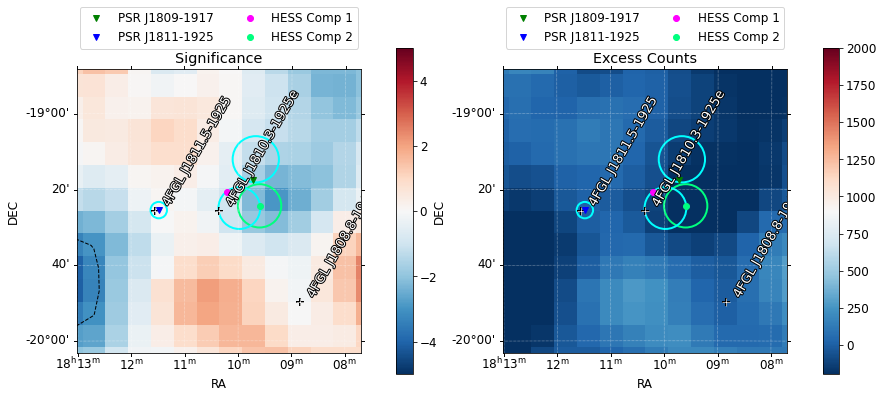

In [21]:
name = 'resid_after_opt'
resid_after_opt = gta.residmap(name,model={'SpatialModel' : 'PointSource', 'Index' : 2.0}, write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_after_opt,levels_wo_source,name)

2022-08-04 08:10:10 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:10:10 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:10:13 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:10:17 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:10:25 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_after_opt_with_j1810_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:10:25 INFO    GTAnalysis.residmap(): Execution time: 15.12 s


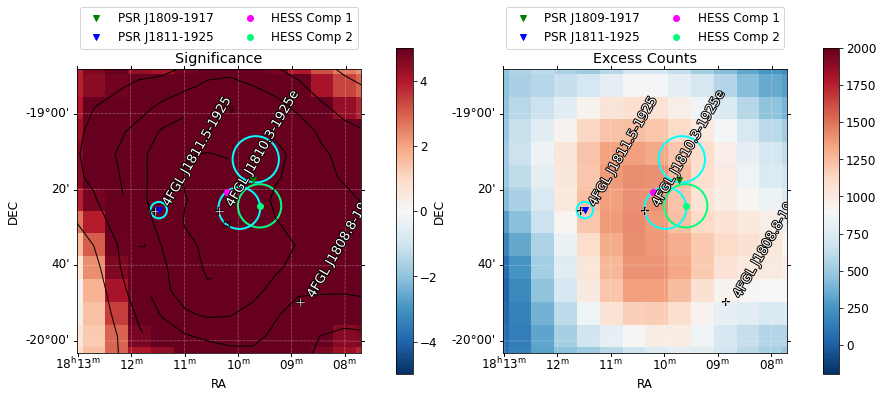

In [22]:
name = 'resid_after_opt_with_j1810'
resid_after_opt_with_j1810 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},
                exclude=['4FGL J1810.3-1925e'], write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_after_opt_with_j1810,levels_with_source,name)

2022-08-04 08:10:30 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:10:30 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:10:31 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:10:36 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:10:44 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_after_opt_with_j1810_and_j1811_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:10:44 INFO    GTAnalysis.residmap(): Execution time: 14.54 s


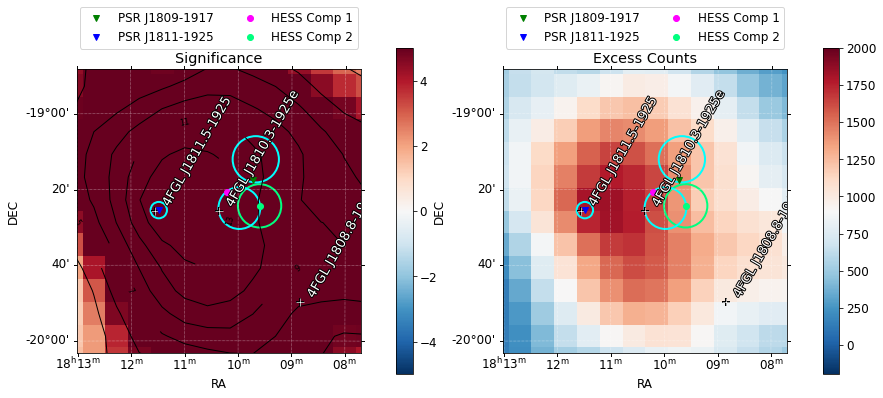

In [23]:
name = 'resid_after_opt_with_j1810_and_j1811'
resid_after_opt_with_j1810_and_j1811 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},
                exclude=['4FGL J1810.3-1925e','4FGL J1811.5-1925'], write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_after_opt_with_j1810_and_j1811,levels_with_source,name)

#### Extension of j1810 in default fermi model, gaussian and radial disk

In [24]:
%%capture
name = 'extension_gauss_default_fermi_model'
extension_gauss_default_fermi_model = gta.extension('4FGL J1810.3-1925e',width=np.linspace(0.1,0.75,10).tolist());
gta.write_roi(name)
plot_extension(extension_gauss_default_fermi_model, name)

2022-08-04 08:10:49 INFO    GTAnalysis.extension(): Running extension fit for 4FGL J1810.3-1925e
2022-08-04 08:11:22 INFO    GTAnalysis._extension(): Fitting extended-source model.
2022-08-04 08:11:32 INFO    GTAnalysis._extension(): Generating TS map.
2022-08-04 08:11:35 INFO    GTAnalysis._extension(): Testing point-source model.
2022-08-04 08:11:40 INFO    GTAnalysis._extension(): Best-fit extension: 0.4491 + 0.0358 - 0.0354
2022-08-04 08:11:40 INFO    GTAnalysis._extension(): TS_ext:        93.631
2022-08-04 08:11:40 INFO    GTAnalysis._extension(): Extension UL: 0.5093
2022-08-04 08:11:40 INFO    GTAnalysis._extension(): LogLike:  1787689.997 DeltaLogLike:       -1.364
2022-08-04 08:11:40 INFO    GTAnalysis.extension(): Finished extension fit.
2022-08-04 08:11:44 WARNING GTAnalysis.extension(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSpars

In [25]:
%%capture
name = 'extension_disk_default_fermi_model'
extension_disk_default_fermi_model = gta.extension('4FGL J1810.3-1925e',width=np.linspace(0.1,0.75,10).tolist(),spatial_model='RadialDisk')
gta.write_roi(name)
plot_extension(extension_disk_default_fermi_model, name)

2022-08-04 08:11:59 INFO    GTAnalysis.extension(): Running extension fit for 4FGL J1810.3-1925e
2022-08-04 08:12:32 INFO    GTAnalysis._extension(): Fitting extended-source model.
2022-08-04 08:12:41 INFO    GTAnalysis._extension(): Generating TS map.
2022-08-04 08:12:44 INFO    GTAnalysis._extension(): Testing point-source model.
2022-08-04 08:12:49 INFO    GTAnalysis._extension(): Best-fit extension: 0.4282 + 0.0336 - 0.0352
2022-08-04 08:12:49 INFO    GTAnalysis._extension(): TS_ext:        96.184
2022-08-04 08:12:49 INFO    GTAnalysis._extension(): Extension UL: 0.4824
2022-08-04 08:12:49 INFO    GTAnalysis._extension(): LogLike:  1787691.247 DeltaLogLike:        6.049
2022-08-04 08:12:49 INFO    GTAnalysis.extension(): Finished extension fit.
2022-08-04 08:12:53 WARNING GTAnalysis.extension(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSpars

#### Let's fit the extension and position of 4FGL J1810.3-1925e and update it in the model

In [26]:
%%capture
name = 'extension_gauss_and_position_fit_j1810_before_fit0'
extension_gauss_and_position_fit_j1810_before_fit0 = gta.extension('4FGL J1810.3-1925e', fit_position=True,  
                                                                   update=True, width_max=5.0, sqrt_ts_threshold=3.0, spatial_model='RadialGaussian')
gta.write_roi(name)
plot_extension(extension_gauss_and_position_fit_j1810_before_fit0, name)

2022-08-04 08:13:08 INFO    GTAnalysis.extension(): Running extension fit for 4FGL J1810.3-1925e
2022-08-04 08:14:18 INFO    GTAnalysis._fit_extension_full(): Iter 0 R68 =    0.448 Offset =    0.072 LogLikelihood = 1787692.65 Delta-LogLikelihood =     1.35
2022-08-04 08:15:25 INFO    GTAnalysis._fit_extension_full(): Iter 1 R68 =    0.463 Offset =    0.074 LogLikelihood = 1787692.75 Delta-LogLikelihood =     0.10
2022-08-04 08:15:25 INFO    GTAnalysis._extension(): Fitting extended-source model.
2022-08-04 08:15:43 INFO    GTAnalysis._extension(): Generating TS map.
2022-08-04 08:15:46 INFO    GTAnalysis._extension(): Testing point-source model.
2022-08-04 08:15:52 INFO    GTAnalysis._extension(): Best-fit extension: 0.4629 + 0.0342 - 0.0331
2022-08-04 08:15:52 INFO    GTAnalysis._extension(): TS_ext:        107.596
2022-08-04 08:15:52 INFO    GTAnalysis._extension(): Extension UL: 0.5207
2022-08-04 08:15:52 INFO    GTAnalysis._extension(): LogLike:  1787692.746 DeltaLogLike:        7.

In [27]:
print(gta.roi['4FGL J1810.3-1925e'])

Name           : 4FGL J1810.3-1925e
Associations   : ['4FGL J1810.3-1925e']
RA/DEC         :    272.513/   -19.414
GLON/GLAT      :     11.027/    -0.047
TS             : 242.85
Npred          : 3619.11
Flux           :  7.14e-09 +/- 4.77e-10
EnergyFlux     : 2.155e-05 +/- 3.26e-06
SpatialModel   : RadialGaussian
SpectrumType   : LogParabola
Spectral Parameters
b'norm'        :  2.637e-12 +/-   1.86e-13
b'alpha'       :      2.537 +/-     0.1091
b'beta'        :   -0.02166 +/-    0.04399
b'Eb'          :       1747 +/-        nan


In [28]:
gta.print_roi()

2022-08-04 08:16:11 INFO    GTAnalysis.print_roi(): 
name                SpatialModel   SpectrumType     offset        ts       npred
--------------------------------------------------------------------------------
4FGL J1810.3-1925e  RadialGaussian LogParabola       0.074    242.85      3619.1
4FGL J1811.5-1925   PointSource    PowerLaw          0.280     42.98       624.9
4FGL J1808.8-1949c  PointSource    PowerLaw          0.537     56.67      1105.6
4FGL J1811.5-1844   PointSource    LogParabola       0.741    102.66      1424.0
4FGL J1808.2-2028e  RadialDisk     LogParabola       1.166    103.42      2458.9
4FGL J1818.1-2000   PointSource    LogParabola       1.921     85.66       520.1
4FGL J1813.1-1737e  RadialDisk     LogParabola       1.928   1353.91      8686.8
4FGL J1804.9-1745   PointSource    PowerLaw          2.109     50.86       532.9
4FGL J1806.2-2126   PointSource    LogParabola       2.221    516.47      3460.6
4FGL J1818.5-2036   PointSource    PowerLaw          2.2

#### Let's now free the sources with the below criteria around 4FGL J1810.3-1925e to refine the fit

In [29]:
# Free Normalization of all Sources within 2 deg of ROI center
gta.free_sources(distance=1.0,pars='norm')
gta.free_sources(minmax_ts=[None,25],free=False)
gta.free_sources(minmax_npred=[None,700],free=False)
# Free all parameters of isotropic and galactic diffuse components
gta.free_source('galdiff')
gta.free_source('isodiff')

2022-08-04 08:16:11 INFO    GTAnalysis.free_source(): Freeing parameters for isodiff               : ['Normalization']
2022-08-04 08:16:11 INFO    GTAnalysis.free_source(): Freeing parameters for galdiff               : ['Prefactor']
2022-08-04 08:16:11 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1818.5-2036     : ['Prefactor', 'Index']
2022-08-04 08:16:11 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1814.1-1710     : ['Prefactor', 'Index']
2022-08-04 08:16:11 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1759.6-1850     : ['Prefactor', 'Index']
2022-08-04 08:16:11 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1758.3-1920     : ['Prefactor', 'Index']
2022-08-04 08:16:11 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1813.1-1611     : ['Prefactor', 'Index']
2022-08-04 08:16:11 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1755.6-2050     : ['Prefactor', 'Index']
2022-08-04 08:16:11 INFO    

#### Let's now free 4FGL J1810.3-1925e and 4FGL J1811.5-1925 

In [30]:
gta.free_source('4FGL J1810.3-1925e')
gta.free_source('4FGL J1811.5-1925')

2022-08-04 08:16:12 INFO    GTAnalysis.free_source(): Freeing parameters for 4FGL J1811.5-1925     : ['Prefactor', 'Index']


In [31]:
fit0 = gta.fit()

2022-08-04 08:16:12 INFO    GTAnalysis.fit(): Starting fit.
2022-08-04 08:26:07 INFO    GTAnalysis.fit(): Fit returned successfully. Quality:   3 Status:   0
2022-08-04 08:26:07 INFO    GTAnalysis.fit(): LogLike:  1787718.797 DeltaLogLike:       26.051 


In [32]:
print('Fit Quality: ',fit0['fit_quality'])
print(gta.roi['4FGL J1810.3-1925e'])

Fit Quality:  3
Name           : 4FGL J1810.3-1925e
Associations   : ['4FGL J1810.3-1925e']
RA/DEC         :    272.513/   -19.414
GLON/GLAT      :     11.027/    -0.047
TS             : 257.41
Npred          : 3853.01
Flux           : 7.611e-09 +/- 8.16e-10
EnergyFlux     : 2.306e-05 +/- 3.87e-06
SpatialModel   : RadialGaussian
SpectrumType   : LogParabola
Spectral Parameters
b'norm'        :  2.812e-12 +/-  3.103e-13
b'alpha'       :      2.505 +/-     0.1681
b'beta'        :   -0.01314 +/-    0.06259
b'Eb'          :       1747 +/-        nan


In [33]:
gta.write_roi('fit0')

2022-08-04 08:26:08 INFO    GTBinnedAnalysis.write_xml(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit0_00.xml...
2022-08-04 08:26:08 INFO    GTAnalysis.write_fits(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit0.fits...
2022-08-04 08:26:22 INFO    GTAnalysis.write_roi(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit0.npy...


In [34]:
%%capture
name = 'resid_fit0'
resid_fit0 = gta.residmap(name,model={'SpatialModel' : 'PointSource', 'Index' : 2.0},write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_fit0,levels_wo_source,name)

2022-08-04 08:26:22 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:26:22 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:26:24 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:26:31 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:26:38 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_fit0_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:26:38 INFO    GTAnalysis.residmap(): Execution time: 16.11 s


#### Let's evaluate the extension again of 4FGL J1810.3-1925e

In [35]:
%%capture
name = 'extension_gauss_after_fit0'
extension_gauss_after_fit0 = gta.extension('4FGL J1810.3-1925e', fit_position=True,  update=True, 
                                           width_max=5.0, sqrt_ts_threshold=3.0, spatial_model='RadialGaussian')
gta.write_roi(name)
plot_extension(extension_gauss_after_fit0, name)

2022-08-04 08:26:43 INFO    GTAnalysis.extension(): Running extension fit for 4FGL J1810.3-1925e
2022-08-04 08:27:52 INFO    GTAnalysis._fit_extension_full(): Iter 0 R68 =    0.492 Offset =    0.016 LogLikelihood = 1787719.24 Delta-LogLikelihood =     0.45
2022-08-04 08:28:59 INFO    GTAnalysis._fit_extension_full(): Iter 1 R68 =    0.497 Offset =    0.017 LogLikelihood = 1787719.25 Delta-LogLikelihood =     0.00
2022-08-04 08:28:59 INFO    GTAnalysis._extension(): Fitting extended-source model.
2022-08-04 08:29:16 INFO    GTAnalysis._extension(): Generating TS map.
2022-08-04 08:29:19 INFO    GTAnalysis._extension(): Testing point-source model.
2022-08-04 08:29:25 INFO    GTAnalysis._extension(): Best-fit extension: 0.4967 + 0.0340 - 0.0338
2022-08-04 08:29:25 INFO    GTAnalysis._extension(): TS_ext:        132.519
2022-08-04 08:29:25 INFO    GTAnalysis._extension(): Extension UL: 0.5544
2022-08-04 08:29:25 INFO    GTAnalysis._extension(): LogLike:  1787719.226 DeltaLogLike:        0.

#### let's now refine the fit again one more time with the background and J1811 

In [36]:
# Free all parameters of isotropic and galactic diffuse components
gta.free_source('galdiff')
gta.free_source('isodiff')

In [37]:
gta.free_source('4FGL J1810.3-1925e')
gta.free_source('4FGL J1811.5-1925')

In [38]:
fit_final = gta.fit()

2022-08-04 08:29:44 INFO    GTAnalysis.fit(): Starting fit.
2022-08-04 08:34:04 INFO    GTAnalysis.fit(): Fit returned successfully. Quality:   3 Status:   0
2022-08-04 08:34:04 INFO    GTAnalysis.fit(): LogLike:  1787719.350 DeltaLogLike:        0.124 


In [39]:
print('Fit Quality: ',fit_final['fit_quality'])
print(gta.roi['4FGL J1810.3-1925e'])

Fit Quality:  3
Name           : 4FGL J1810.3-1925e
Associations   : ['4FGL J1810.3-1925e']
RA/DEC         :    272.496/   -19.418
GLON/GLAT      :     11.016/    -0.034
TS             : 260.64
Npred          : 4024.88
Flux           :  7.95e-09 +/- 7.69e-10
EnergyFlux     : 2.413e-05 +/-  3.6e-06
SpatialModel   : RadialGaussian
SpectrumType   : LogParabola
Spectral Parameters
b'norm'        :  2.938e-12 +/-  3.018e-13
b'alpha'       :      2.497 +/-     0.1162
b'beta'        :     -0.011 +/-    0.04317
b'Eb'          :       1747 +/-        nan


#### Get the best fit source locations with errors

In [40]:
loc_j1810 = gta.localize('4FGL J1810.3-1925e', make_plots=True)
print('RA:',loc_j1810['ra'],'+/-',loc_j1810['ra_err'])
print('Dec:',loc_j1810['dec'],'+/-',loc_j1810['dec_err'])

2022-08-04 08:34:04 INFO    GTAnalysis.localize(): Running localization for 4FGL J1810.3-1925e
2022-08-04 08:34:25 INFO    GTAnalysis._localize(): Localization succeeded.
2022-08-04 08:34:25 INFO    GTAnalysis._localize(): Updating source 4FGL J1810.3-1925e to localized position.
2022-08-04 08:34:25 INFO    GTAnalysis.delete_source(): Deleting source 4FGL J1810.3-1925e
2022-08-04 08:34:25 INFO    GTAnalysis.add_source(): Adding source 4FGL J1810.3-1925e
2022-08-04 08:34:30 INFO    GTAnalysis._localize(): Localization completed with new position:
(  ra, dec) = (  272.4883 +/-   0.0348,  -19.4229 +/-   0.0405)
(glon,glat) = (   11.0082 +/-   0.0439,   -0.0304 +/-   0.0305)
offset =   0.0087 r68 =   0.0555 r95 =   0.0895 r99 =   0.1110
2022-08-04 08:34:30 INFO    GTAnalysis._localize(): LogLike:  1787719.373 DeltaLogLike:        0.024
2022-08-04 08:34:30 INFO    GTAnalysis.localize(): Finished localization.
2022-08-04 08:34:39 WARNING GTAnalysis.localize(): Saving TS maps in .npy files is

RA: 272.4882858003564 +/- 0.03481485446474097
Dec: -19.4229329383148 +/- 0.04054652978805877


In [41]:
loc_j1811 = gta.localize('4FGL J1811.5-1925', make_plots=True)
print('RA:',loc_j1811['ra'],'+/-',loc_j1811['ra_err'])
print('Dec:',loc_j1811['dec'],'+/-',loc_j1811['dec_err'])

2022-08-04 08:34:39 INFO    GTAnalysis.localize(): Running localization for 4FGL J1811.5-1925
2022-08-04 08:34:58 INFO    GTAnalysis._localize(): Localization succeeded.
2022-08-04 08:34:58 INFO    GTAnalysis._localize(): Updating source 4FGL J1811.5-1925 to localized position.
2022-08-04 08:34:58 INFO    GTAnalysis.delete_source(): Deleting source 4FGL J1811.5-1925
2022-08-04 08:34:58 INFO    GTAnalysis.add_source(): Adding source 4FGL J1811.5-1925
2022-08-04 08:35:02 INFO    GTAnalysis._localize(): Localization completed with new position:
(  ra, dec) = (  272.8731 +/-   0.0209,  -19.4124 +/-   0.0215)
(glon,glat) = (   11.1925 +/-   0.0233,   -0.3432 +/-   0.0189)
offset =   0.0197 r68 =   0.0317 r95 =   0.0512 r99 =   0.0635
2022-08-04 08:35:02 INFO    GTAnalysis._localize(): LogLike:  1787719.336 DeltaLogLike:       -0.037
2022-08-04 08:35:02 INFO    GTAnalysis.localize(): Finished localization.
2022-08-04 08:35:10 WARNING GTAnalysis.localize(): Saving TS maps in .npy files is dis

RA: 272.87305701664536 +/- 0.020918351661755857
Dec: -19.41237431316954 +/- 0.021520455708080727


2022-08-04 08:35:10 INFO    GTBinnedAnalysis.write_xml(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_final_00.xml...
2022-08-04 08:35:10 INFO    GTAnalysis.write_fits(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_final.fits...
2022-08-04 08:35:24 INFO    GTAnalysis.write_roi(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_final.npy...


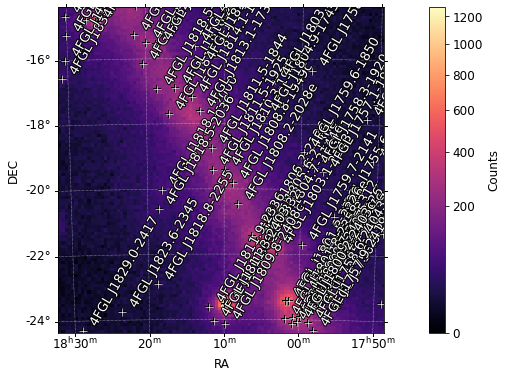

In [42]:
gta.write_roi('fit_final',make_plots=True)

In [43]:
from IPython.display import Image, display
from glob import glob

In [44]:
pngs = glob(f'../{energy_threshold}/*.png')

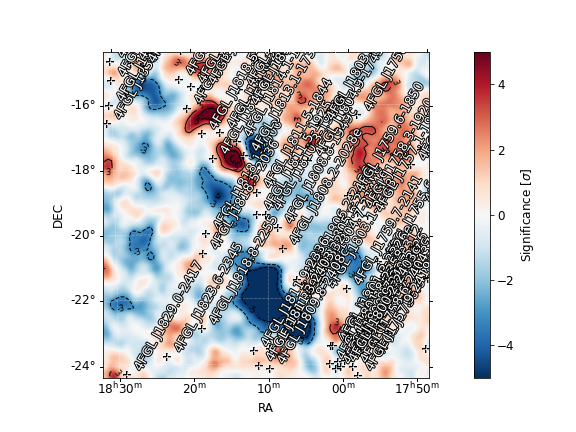

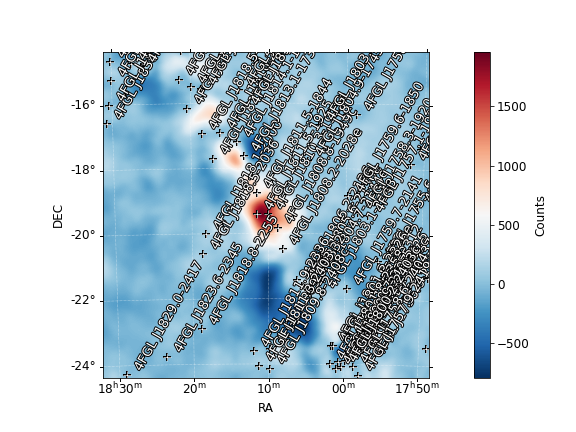

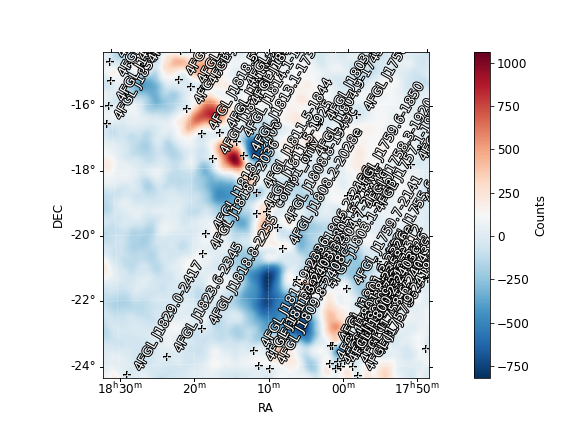

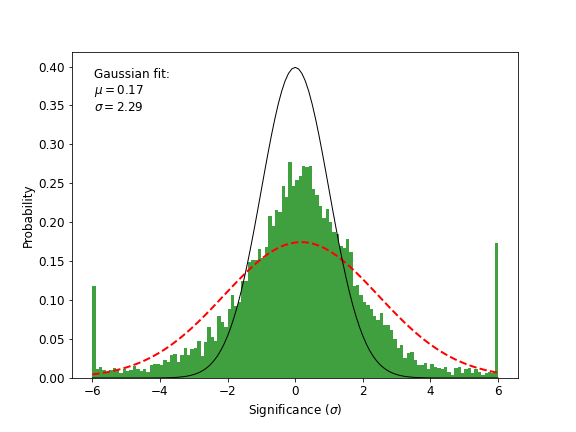

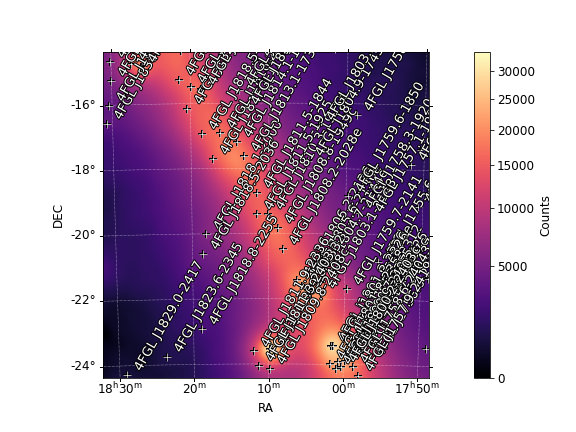

...

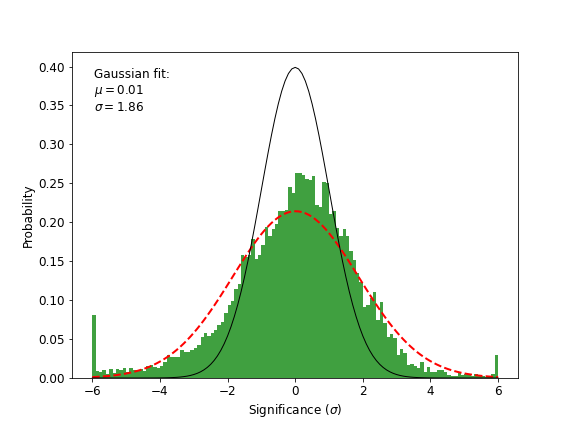

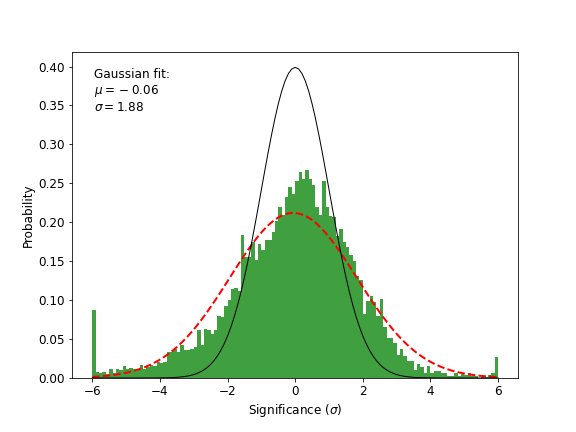

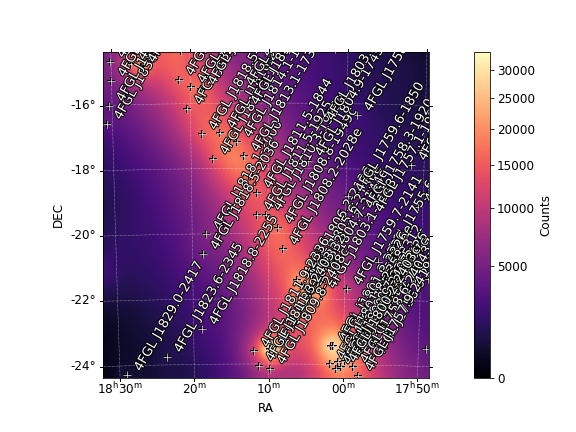

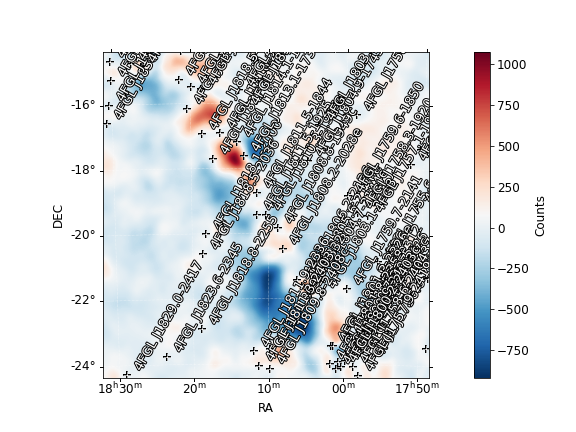

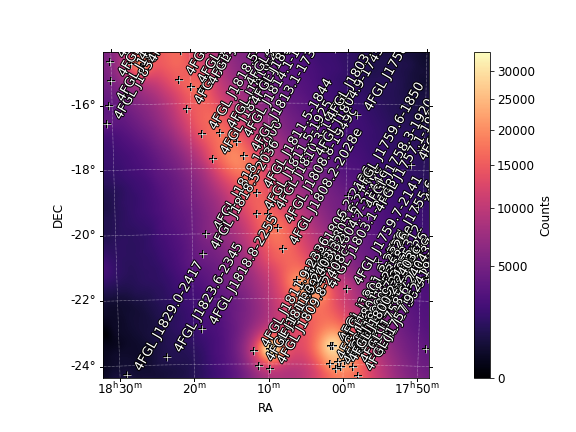

In [45]:
if(True):
    for png in pngs:
        my_image = Image(png)
        display(my_image)

#### lets look at the residual after the final fit

2022-08-04 08:35:29 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:35:29 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:35:31 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:35:36 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:35:44 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_fit_final_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:35:44 INFO    GTAnalysis.residmap(): Execution time: 14.23 s


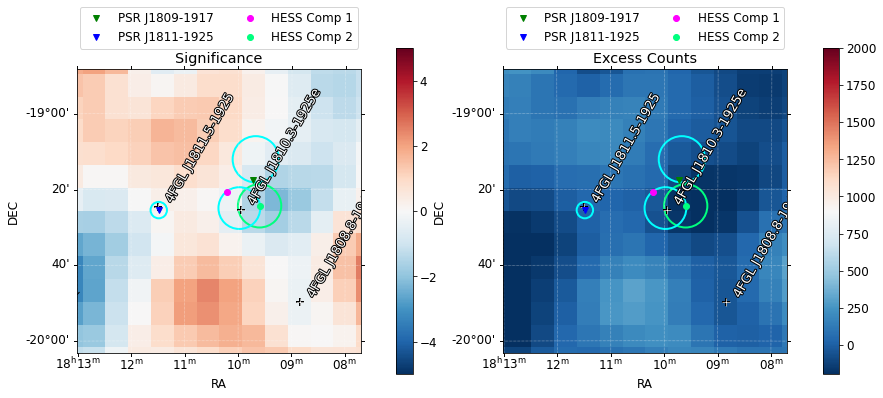

In [46]:
name = 'resid_fit_final'
resid_fit_final = gta.residmap(name,model={'SpatialModel' : 'PointSource', 'Index' : 2.0},write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_fit_final,levels_wo_source,name)

2022-08-04 08:35:48 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:35:48 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:35:50 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:35:55 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:36:02 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_fit_final_with_j1810_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:36:02 INFO    GTAnalysis.residmap(): Execution time: 14.01 s


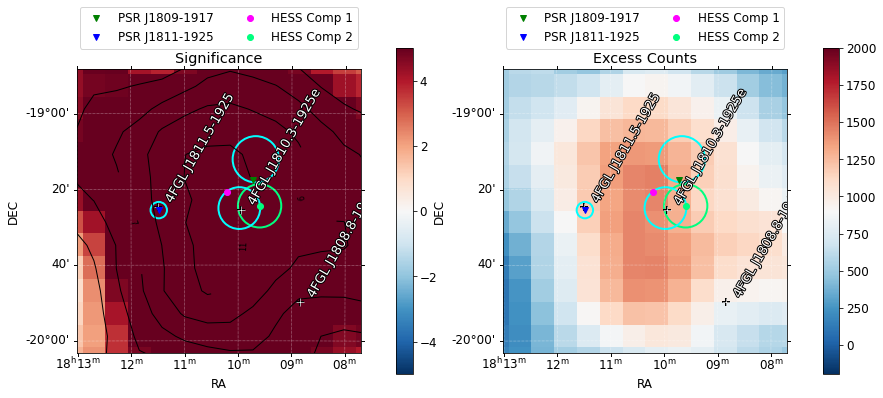

In [47]:
name = 'resid_fit_final_with_j1810'
resid_fit_final_with_j1810 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},
                exclude=['4FGL J1810.3-1925e'], write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_fit_final_with_j1810,levels_with_source,name)

2022-08-04 08:36:07 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:36:07 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:36:09 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:36:14 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:36:21 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_fit_final_with_j1810_and_j1811_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:36:21 INFO    GTAnalysis.residmap(): Execution time: 13.80 s


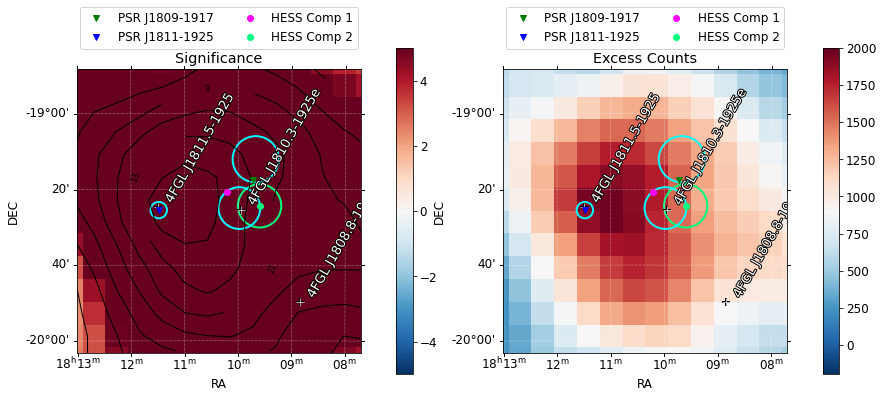

In [48]:
name = 'resid_fit_final_with_j1810_and_j1811'
resid_fit_final_with_j1810_and_j1811 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},
                exclude=['4FGL J1810.3-1925e','4FGL J1811.5-1925'], write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_fit_final_with_j1810_and_j1811,levels_with_source,name)

#### Let's now get the  spectrum

2022-08-04 08:36:26 INFO    GTAnalysis.sed(): Computing SED for 4FGL J1810.3-1925e
2022-08-04 08:37:10 INFO    GTAnalysis._make_sed(): Fitting SED
2022-08-04 08:37:10 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1810.3-1925e    : ['alpha', 'beta']
2022-08-04 08:37:10 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1811.5-1925     : ['Index']
2022-08-04 08:37:10 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1808.8-1949c    : ['Index']
2022-08-04 08:37:10 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1811.5-1844     : ['alpha', 'beta']
2022-08-04 08:37:10 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1808.2-2028e    : ['alpha', 'beta']
2022-08-04 08:37:10 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1813.1-1737e    : ['alpha', 'beta']
2022-08-04 08:37:10 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1806.2-2126     : ['alpha', 'beta']
2022-08-04 08:37:10 INFO    GTAnalysis.free

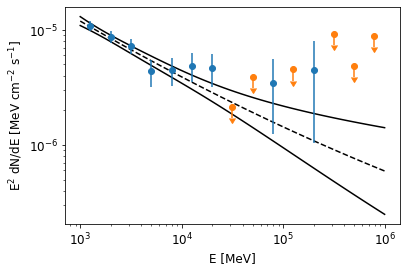

In [49]:
source_name = '4FGL J1810.3-1925e'
result_name = 'fit_final'
sed_j1810_fit_final = gta.sed(source_name)
plot_spectrum(result_name, sed_j1810_fit_final, source_name)

In [50]:
print(gta.roi['4FGL J1810.3-1925e'])
print('Fit Quality: ',fit_final['fit_quality'])

Name           : 4FGL J1810.3-1925e
Associations   : ['4FGL J1810.3-1925e']
RA/DEC         :    272.488/   -19.423
GLON/GLAT      :     11.008/    -0.030
TS             : 282.08
Npred          : 4026.34
Flux           : 7.953e-09 +/- 4.94e-10
EnergyFlux     : 2.411e-05 +/- 3.33e-06
SpatialModel   : RadialGaussian
SpectrumType   : LogParabola
Spectral Parameters
b'norm'        :  2.939e-12 +/-          0
b'alpha'       :      2.498 +/-          0
b'beta'        :   -0.01101 +/-          0
b'Eb'          :       1747 +/-        nan
Fit Quality:  3


2022-08-04 08:37:39 INFO    GTAnalysis.sed(): Computing SED for 4FGL J1811.5-1925
2022-08-04 08:38:21 INFO    GTAnalysis._make_sed(): Fitting SED
2022-08-04 08:38:21 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1810.3-1925e    : ['alpha', 'beta']
2022-08-04 08:38:21 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1811.5-1925     : ['Index']
2022-08-04 08:38:21 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1808.8-1949c    : ['Index']
2022-08-04 08:38:21 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1811.5-1844     : ['alpha', 'beta']
2022-08-04 08:38:21 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1808.2-2028e    : ['alpha', 'beta']
2022-08-04 08:38:21 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1813.1-1737e    : ['alpha', 'beta']
2022-08-04 08:38:21 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1806.2-2126     : ['alpha', 'beta']
2022-08-04 08:38:21 INFO    GTAnalysis.free_

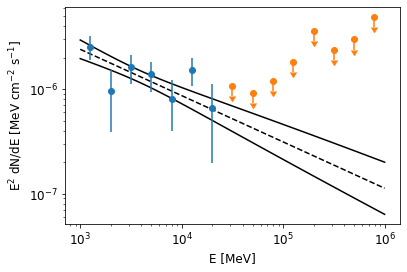

In [51]:
source_name = '4FGL J1811.5-1925'
result_name = 'fit_final'
sed_j1811_fit_final = gta.sed(source_name)
plot_spectrum(result_name, sed_j1811_fit_final, source_name)

In [52]:
print(gta.roi['4FGL J1811.5-1925'])
print('Fit Quality: ',fit_final['fit_quality'])

Name           : 4FGL J1811.5-1925
Associations   : ['4FGL J1811.5-1925']
RA/DEC         :    272.873/   -19.412
GLON/GLAT      :     11.192/    -0.343
TS             : 59.28
Npred          : 839.66
Flux           : 1.663e-09 +/- 2.73e-10
EnergyFlux     :  5.16e-06 +/- 8.44e-07
SpatialModel   : PointSource
SpectrumType   : PowerLaw
Spectral Parameters
b'Prefactor'   :  1.758e-14 +/-  2.995e-15
b'Index'       :     -2.443 +/-    -0.1362
b'Scale'       :       7480 +/-        nan
Fit Quality:  3


#### Extract the flux points for hess comp2

In [53]:
gta.delete_source('comp2_on_fermi_fit')

2022-08-04 08:38:49 ERROR   GTAnalysis.delete_source(): No source with name: comp2_on_fermi_fit


In [54]:
gta.add_source('comp2_on_fermi_fit',{'ra': hess_comp2_ra, 'dec': hess_comp2_dec,
                'SpectrumType' : 'PowerLaw',  
                'Index':{'scale':1, 'value':2.358459341, 'free':1, 'max':5, 'min':0},
                'Scale' : {'scale':1e3, 'value':1.746902125, 'free':0},
                'SpatialModel' : 'SpatialMap', 'Spatial_Filename': '/lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/common_files/template_comp2_gammapy_loc.fits','prefactor':{'free':1}})

2022-08-04 08:38:49 INFO    GTAnalysis.add_source(): Adding source comp2_on_fermi_fit


In [55]:
gta.free_sources(free=False)
gta.free_source('comp2_on_fermi_fit')

2022-08-04 08:39:09 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1810.3-1925e    : ['norm', 'alpha', 'beta']
2022-08-04 08:39:09 INFO    GTAnalysis.free_source(): Fixing parameters for comp2_on_fermi_fit    : ['Prefactor', 'Index']
2022-08-04 08:39:09 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1811.5-1925     : ['Prefactor', 'Index']
2022-08-04 08:39:09 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1808.8-1949c    : ['Prefactor', 'Index']
2022-08-04 08:39:09 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1811.5-1844     : ['norm', 'alpha', 'beta']
2022-08-04 08:39:09 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1808.2-2028e    : ['norm', 'alpha', 'beta']
2022-08-04 08:39:09 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1813.1-1737e    : ['norm', 'alpha', 'beta']
2022-08-04 08:39:09 INFO    GTAnalysis.free_source(): Fixing parameters for 4FGL J1806.2-2126     : ['norm', 'alpha', 'beta']
2

In [56]:
gta.print_params()

2022-08-04 08:39:10 INFO    GTAnalysis.print_params(): 
 idx parname                  value     error       min       max     scale free
--------------------------------------------------------------------------------
comp2_on_fermi_fit
 500 Prefactor                    1         0     1e-05     1e+03     1e-12    *
 501 Index                     2.36         0         0         5         1    *
 502 Scale                     1.75         0     0.001     1e+03     1e+03     



In [57]:
fit_gammapy_template_comp2 = gta.fit()

2022-08-04 08:39:10 INFO    GTAnalysis.fit(): Starting fit.
2022-08-04 08:39:12 INFO    GTAnalysis.fit(): Fit returned successfully. Quality:   3 Status:   0
2022-08-04 08:39:12 INFO    GTAnalysis.fit(): LogLike:  1787717.804 DeltaLogLike: 515062502951.568 


In [58]:
print(gta.roi['comp2_on_fermi_fit'])
print('Fit Quality: ',fit_gammapy_template_comp2['fit_quality'])

Name           : comp2_on_fermi_fit
Associations   : ['comp2_on_fermi_fit']
RA/DEC         :    272.400/   -19.406
GLON/GLAT      :     10.983/     0.051
TS             : -3.06
Npred          : 4.91
Flux           : 9.994e-12 +/- 1.92e-19
EnergyFlux     : 5.008e-06 +/- 9.61e-14
SpatialModel   : SpatialMap
SpectrumType   : PowerLaw
Spectral Parameters
b'Prefactor'   :      1e-17 +/-  1.914e-25
b'Index'       :          0 +/-  3.101e-10
b'Scale'       :       1747 +/-        nan
Fit Quality:  3


In [59]:
gta.write_roi('fit_gammapy_template_comp2')

2022-08-04 08:39:12 INFO    GTBinnedAnalysis.write_xml(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp2_00.xml...
2022-08-04 08:39:12 INFO    GTAnalysis.write_fits(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp2.fits...
2022-08-04 08:39:27 INFO    GTAnalysis.write_roi(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp2.npy...


2022-08-04 08:39:27 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:39:27 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:39:28 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:39:28 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:39:36 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_gammapy_template_comp2_on_fermipy_fit_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:39:36 INFO    GTAnalysis.residmap(): Execution time: 9.43 s


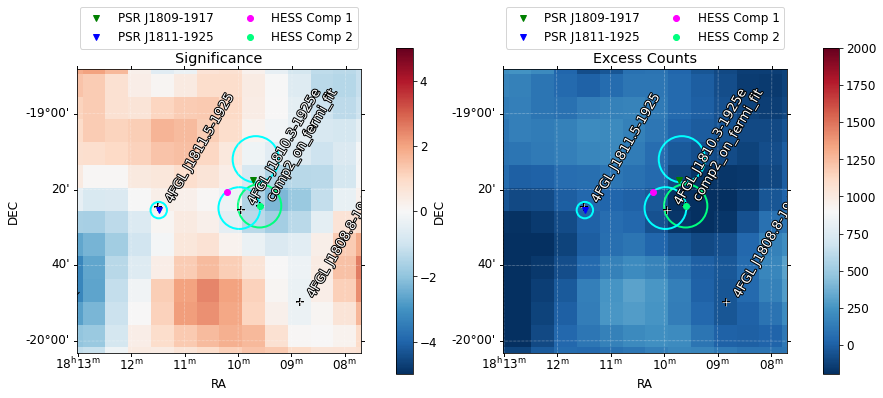

In [60]:
name = 'resid_gammapy_template_comp2_on_fermipy_fit'
resid_gammapy_template_comp2_on_fermipy_fit = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0})
plot_sig_ex_maps(resid_gammapy_template_comp2_on_fermipy_fit,levels_wo_source,name)

2022-08-04 08:39:41 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:39:41 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:39:43 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:39:43 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:39:50 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_gammapy_template_comp2_on_fermipy_fit_with_comp2_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:39:50 INFO    GTAnalysis.residmap(): Execution time: 9.10 s


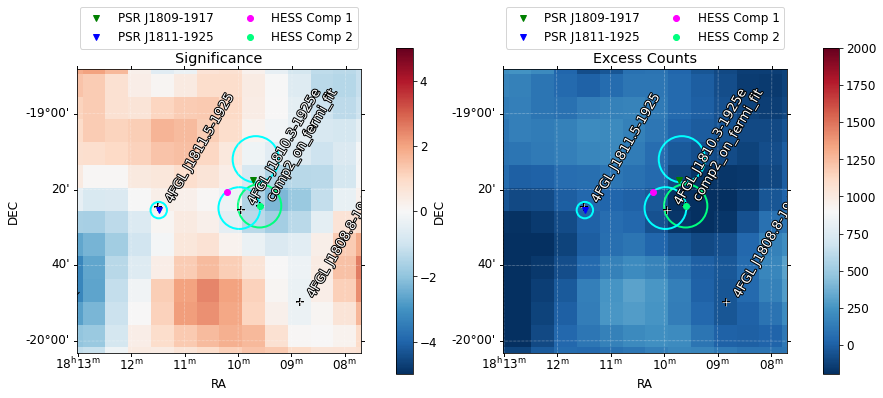

In [61]:
name = 'resid_gammapy_template_comp2_on_fermipy_fit_with_comp2'
resid_gammapy_template_comp2_on_fermipy_fit_with_comp2 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},
                exclude=['comp2_on_fermi_fit'])
plot_sig_ex_maps(resid_gammapy_template_comp2_on_fermipy_fit_with_comp2,levels_with_source,name)

2022-08-04 08:39:55 INFO    GTAnalysis.sed(): Computing SED for comp2_on_fermi_fit
2022-08-04 08:39:56 INFO    GTAnalysis._make_sed(): Fitting SED
2022-08-04 08:39:56 INFO    GTAnalysis.free_source(): Fixing parameters for comp2_on_fermi_fit    : ['Index']
2022-08-04 08:40:15 INFO    GTAnalysis.sed(): Finished SED
2022-08-04 08:40:23 INFO    GTAnalysis.sed(): Execution time: 27.71 s


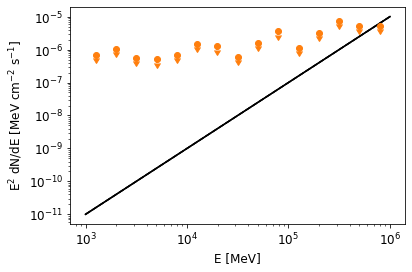

In [62]:
source_name = 'comp2_on_fermi_fit'
result_name = 'fit_gammapy_template_comp2'
sed_comp2_fit_gammapy_template_comp2 = gta.sed(source_name)
plot_spectrum(result_name, sed_comp2_fit_gammapy_template_comp2, source_name)

In [63]:
sed_comp2_fit_gammapy_template_comp2['ts']

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 4.12774629e-01, 2.14413159e-02, 0.00000000e+00,
       2.94230516e-02, 1.97490660e+00, 0.00000000e+00, 1.26916701e-04,
       1.73545580e+00, 0.00000000e+00, 0.00000000e+00])

#### Asymmetric gaussian fit (template from gammapy hess source fit)

In [64]:
# Free Normalization of all Sources within 2 deg of ROI center
gta.free_sources(free=False)

2022-08-04 08:40:25 INFO    GTAnalysis.free_source(): Fixing parameters for comp2_on_fermi_fit    : ['Prefactor', 'Index']


#### gammapy comp1 template

In [65]:
gta.delete_source('4FGL J1810.3-1925e')
gta.delete_source('comp2_on_fermi_fit')
gta.delete_source('comp1_only')
gta.delete_source('comp2')
gta.delete_source('comp2')

2022-08-04 08:40:25 INFO    GTAnalysis.delete_source(): Deleting source 4FGL J1810.3-1925e
2022-08-04 08:40:25 INFO    GTAnalysis.delete_source(): Deleting source comp2_on_fermi_fit
2022-08-04 08:40:25 ERROR   GTAnalysis.delete_source(): No source with name: comp1_only
2022-08-04 08:40:25 ERROR   GTAnalysis.delete_source(): No source with name: comp2
2022-08-04 08:40:25 ERROR   GTAnalysis.delete_source(): No source with name: comp2


In [66]:
gta.add_source('comp1_only',{'ra': hess_comp1_ra, 'dec': hess_comp1_dec,
                'SpectrumType' : 'LogParabola', 
                'norm':{'scale':1e-12, 'value':2.603447802, 'free':1 ,'max':10000, 'min':0}, 
                'alpha':{'scale':1, 'value':2.358459341, 'free':1, 'max':5, 'min':0},
                'beta':{'scale':0.1, 'value':0.4439698035, 'free':1, 'max':15, 'min':-5}, 
                'Eb' : {'scale':1e3, 'value':1.746902125, 'free':0},
                'SpatialModel' : 'SpatialMap', 
                'Spatial_Filename': '/lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/common_files/template_comp1_gammapy_loc.fits', 'prefactor':{'free':1}})

2022-08-04 08:40:25 INFO    GTAnalysis.add_source(): Adding source comp1_only


In [67]:
gta.free_source('comp1_only')

In [68]:
gta.print_params()

2022-08-04 08:40:43 INFO    GTAnalysis.print_params(): 
 idx parname                  value     error       min       max     scale free
--------------------------------------------------------------------------------
comp1_only
 496 norm                       2.6         0         0     1e+04     1e-12    *
 497 alpha                     2.36         0         0         5         1    *
 498 beta                     0.444         0        -5        15       0.1    *
 499 Eb                        1.75         0     0.001     1e+03     1e+03     



In [69]:
fit_gammapy_template_comp1 = gta.fit()

2022-08-04 08:40:43 INFO    GTAnalysis.fit(): Starting fit.
2022-08-04 08:40:44 INFO    GTAnalysis.fit(): Fit returned successfully. Quality:   3 Status:   0
2022-08-04 08:40:44 INFO    GTAnalysis.fit(): LogLike:  1787709.655 DeltaLogLike:        8.914 


In [70]:
print(gta.roi['comp1_only'])
print('Fit Quality: ',fit_gammapy_template_comp1['fit_quality'])

Name           : comp1_only
Associations   : ['comp1_only']
RA/DEC         :    272.551/   -19.344
GLON/GLAT      :     11.106/    -0.044
TS             : 261.09
Npred          : 4803.34
Flux           : 9.537e-09 +/- 6.09e-10
EnergyFlux     : 2.744e-05 +/- 3.57e-06
SpatialModel   : SpatialMap
SpectrumType   : LogParabola
Spectral Parameters
b'norm'        :  3.565e-12 +/-  2.475e-13
b'alpha'       :       2.38 +/-     0.1165
b'beta'        :    0.04434 +/-    0.06095
b'Eb'          :       1747 +/-        nan
Fit Quality:  3


In [71]:
gta.write_roi('fit_gammapy_template_comp1')

2022-08-04 08:40:44 INFO    GTBinnedAnalysis.write_xml(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp1_00.xml...
2022-08-04 08:40:44 INFO    GTAnalysis.write_fits(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp1.fits...
2022-08-04 08:40:58 INFO    GTAnalysis.write_roi(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp1.npy...


2022-08-04 08:40:58 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:40:58 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:40:59 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:41:04 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:41:11 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_gammapy_template_comp1_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:41:11 INFO    GTAnalysis.residmap(): Execution time: 13.46 s


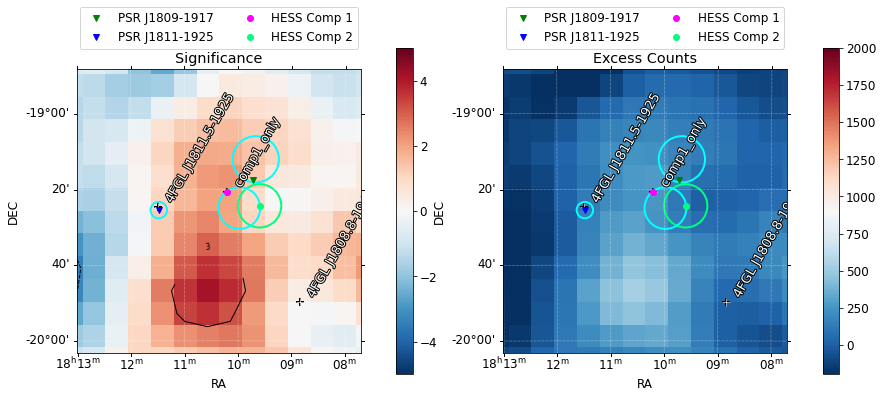

In [72]:
name = 'resid_gammapy_template_comp1'
resid_gammapy_template_comp1 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_gammapy_template_comp1,levels_wo_source,name)

2022-08-04 08:41:16 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:41:16 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:41:17 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:41:22 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:41:29 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_gammapy_template_comp1_with_comp1_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:41:29 INFO    GTAnalysis.residmap(): Execution time: 13.89 s


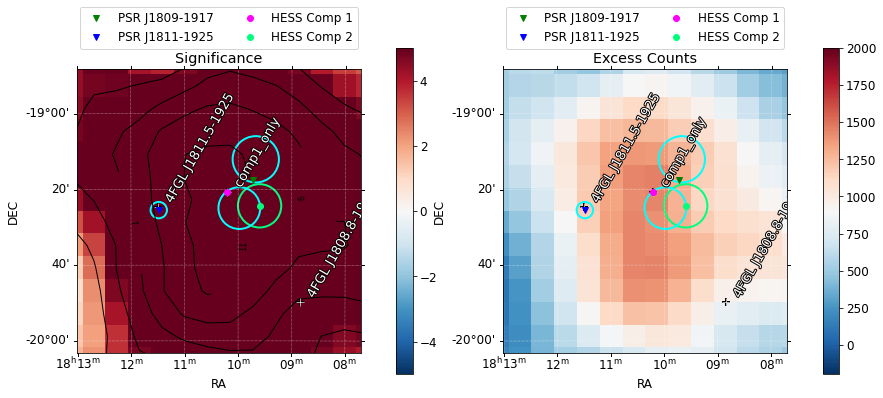

In [73]:
name = 'resid_gammapy_template_comp1_with_comp1'
resid_gammapy_template_comp1_with_comp1 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},
                exclude=['comp1_only'],write_fits=True,write_npy=True,make_plots=True)
plot_sig_ex_maps(resid_gammapy_template_comp1_with_comp1,levels_with_source,name)

#### Evaluate the flux points using gammapy template

2022-08-04 08:41:34 INFO    GTAnalysis.sed(): Computing SED for comp1_only
2022-08-04 08:41:35 INFO    GTAnalysis._make_sed(): Fitting SED
2022-08-04 08:41:35 INFO    GTAnalysis.free_source(): Fixing parameters for comp1_only            : ['alpha', 'beta']
2022-08-04 08:41:54 INFO    GTAnalysis.sed(): Finished SED
2022-08-04 08:42:01 INFO    GTAnalysis.sed(): Execution time: 27.10 s


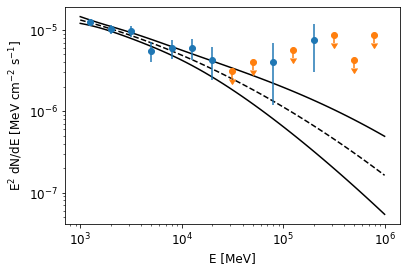

In [74]:
source_name = 'comp1_only'
result_name = 'fit_gammapy_template_comp1'
sed_comp1_fit_gammapy_template_comp1 = gta.sed(source_name)
plot_spectrum(result_name, sed_comp1_fit_gammapy_template_comp1, source_name)

#### add also gammapy comp2 template

In [75]:
gta.delete_source('comp1_only')

2022-08-04 08:42:02 INFO    GTAnalysis.delete_source(): Deleting source comp1_only


In [76]:
gta.delete_source('comp2')
gta.delete_source('comp1')

2022-08-04 08:42:02 ERROR   GTAnalysis.delete_source(): No source with name: comp2
2022-08-04 08:42:02 ERROR   GTAnalysis.delete_source(): No source with name: comp1


In [77]:
gta.add_source('comp1',{'ra': hess_comp1_ra, 'dec': hess_comp1_dec,
                'SpectrumType' : 'LogParabola', 
                'norm':{'scale':1e-12, 'value':2.603447802, 'free':1 ,'max':10000, 'min':0}, 
                'alpha':{'scale':1, 'value':2.358459341, 'free':1, 'max':5, 'min':0},
                'beta':{'scale':0.1, 'value':0.4439698035, 'free':1, 'max':15, 'min':-5}, 
                'Eb' : {'scale':1e3, 'value':1.746902125, 'free':0},
                'SpatialModel' : 'SpatialMap', 
                'Spatial_Filename': '/lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/common_files/template_comp1_gammapy_loc.fits', 'prefactor':{'free':1}})
gta.add_source('comp2',{'ra': hess_comp2_ra, 'dec': hess_comp2_dec,
                'SpectrumType' : 'PowerLaw', 
                'Index':{'scale':1, 'value':2.358459341, 'free':1, 'max':5, 'min':0},
                'Scale' : {'scale':1e3, 'value':1.746902125, 'free':0},
                'SpatialModel' : 'SpatialMap', 
                'Spatial_Filename': '/lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/common_files/template_comp2_gammapy_loc.fits','prefactor':{'free':1}})

2022-08-04 08:42:02 INFO    GTAnalysis.add_source(): Adding source comp1
2022-08-04 08:42:19 INFO    GTAnalysis.add_source(): Adding source comp2


In [78]:
gta.free_sources(free=False)
gta.free_source('comp1')
gta.free_source('comp2')

2022-08-04 08:42:36 INFO    GTAnalysis.free_source(): Fixing parameters for comp1                 : ['norm', 'alpha', 'beta']
2022-08-04 08:42:36 INFO    GTAnalysis.free_source(): Fixing parameters for comp2                 : ['Prefactor', 'Index']
2022-08-04 08:42:36 INFO    GTAnalysis.free_source(): Freeing parameters for comp1                 : ['norm', 'alpha', 'beta']
2022-08-04 08:42:36 INFO    GTAnalysis.free_source(): Freeing parameters for comp2                 : ['Prefactor', 'Index']


In [79]:
gta.print_params()

2022-08-04 08:42:37 INFO    GTAnalysis.print_params(): 
 idx parname                  value     error       min       max     scale free
--------------------------------------------------------------------------------
comp1
 496 norm                       2.6         0         0     1e+04     1e-12    *
 497 alpha                     2.36         0         0         5         1    *
 498 beta                     0.444         0        -5        15       0.1    *
 499 Eb                        1.75         0     0.001     1e+03     1e+03     
comp2
 500 Prefactor                    1         0     1e-05     1e+03     1e-12    *
 501 Index                     2.36         0         0         5         1    *
 502 Scale                     1.75         0     0.001     1e+03     1e+03     



In [80]:
fit_gammapy_template_comp1_and_comp2 = gta.fit()

2022-08-04 08:42:37 INFO    GTAnalysis.fit(): Starting fit.
2022-08-04 08:42:40 INFO    GTAnalysis.fit(): Fit returned successfully. Quality:   2 Status: 102
2022-08-04 08:42:40 INFO    GTAnalysis.fit(): LogLike:  1787698.866 DeltaLogLike: 515062502776.820 


In [81]:
print(gta.roi['comp1'])
print(gta.roi['comp2'])
print('Fit Quality: ',fit_gammapy_template_comp1_and_comp2['fit_quality'])

Name           : comp1
Associations   : ['comp1']
RA/DEC         :    272.551/   -19.344
GLON/GLAT      :     11.106/    -0.044
TS             : 260.29
Npred          : 4791.51
Flux           : 9.528e-09 +/- 2.86e-12
EnergyFlux     : 2.636e-05 +/- 1.82e-08
SpatialModel   : SpatialMap
SpectrumType   : LogParabola
Spectral Parameters
b'norm'        :  3.594e-12 +/-  1.017e-15
b'alpha'       :      2.347 +/-  0.0003931
b'beta'        :    0.07403 +/-  0.0001995
b'Eb'          :       1747 +/-        nan
Name           : comp2
Associations   : ['comp2']
RA/DEC         :    272.400/   -19.406
GLON/GLAT      :     10.983/     0.051
TS             : -21.44
Npred          : 20.52
Flux           : 4.176e-11 +/-  1.2e-09
EnergyFlux     : 2.333e-05 +/- 0.000714
SpatialModel   : SpatialMap
SpectrumType   : PowerLaw
Spectral Parameters
b'Prefactor'   :      1e-17 +/-  3.142e-19
b'Index'       :     0.2616 +/-      5.198
b'Scale'       :       1747 +/-        nan
Fit Quality:  2


In [82]:
gta.write_roi('fit_gammapy_template_comp1_and_comp2')

2022-08-04 08:42:40 INFO    GTBinnedAnalysis.write_xml(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp1_and_comp2_00.xml...
2022-08-04 08:42:40 INFO    GTAnalysis.write_fits(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp1_and_comp2.fits...
2022-08-04 08:42:54 INFO    GTAnalysis.write_roi(): Writing /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/fit_gammapy_template_comp1_and_comp2.npy...


2022-08-04 08:42:54 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:42:54 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:42:55 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:42:55 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:43:02 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_fit_gammapy_template_comp1_and_comp2_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:43:02 INFO    GTAnalysis.residmap(): Execution time: 8.95 s


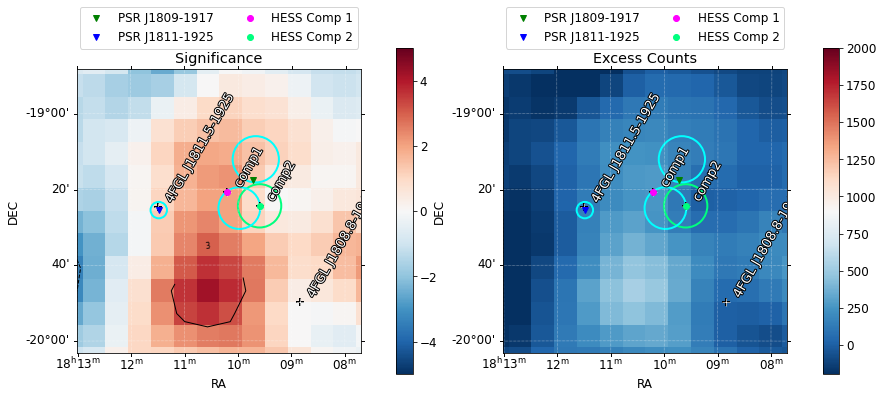

In [83]:
name = 'resid_fit_gammapy_template_comp1_and_comp2'
resid_fit_gammapy_template_comp1_and_comp2 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},)
plot_sig_ex_maps(resid_fit_gammapy_template_comp1_and_comp2,levels_wo_source,name)

2022-08-04 08:43:07 INFO    GTAnalysis.residmap(): Generating residual maps
2022-08-04 08:43:07 INFO    GTAnalysis.add_source(): Adding source residmap_testsource
2022-08-04 08:43:09 INFO    GTAnalysis.delete_source(): Deleting source residmap_testsource
2022-08-04 08:43:09 INFO    GTAnalysis.residmap(): Finished residual maps
2022-08-04 08:43:16 WARNING GTAnalysis.residmap(): Saving maps in .npy files is disabled b/c of incompatibilities in python3, remove the maps from the /lfs/l7/hawc/users/vikasj78/J1809-193_Analysis/hess-j1809/fermi_analysis/results1GeVSparseEnergyBins/resid_fit_gammapy_template_comp1_and_comp2_with_comp2_pointsource_powerlaw_2.00_residmap.npy
2022-08-04 08:43:16 INFO    GTAnalysis.residmap(): Execution time: 9.05 s


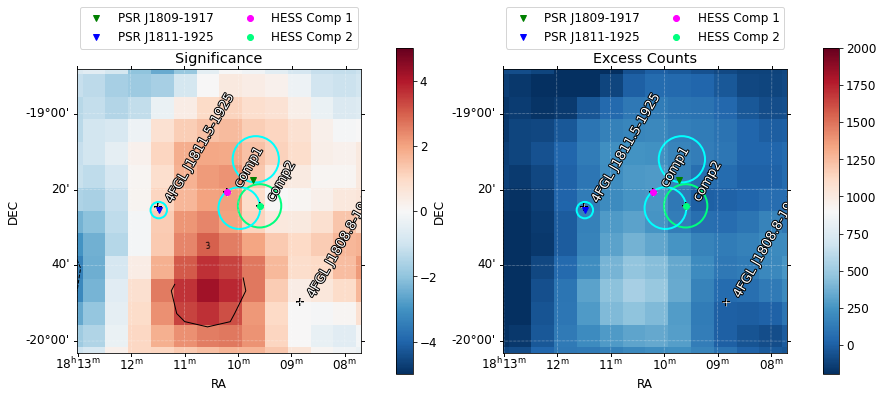

In [84]:
name = 'resid_fit_gammapy_template_comp1_and_comp2_with_comp2'
resid_fit_gammapy_template_comp1_and_comp2_with_comp2 = gta.residmap(name,
                model={'SpatialModel' : 'PointSource', 'Index' : 2.0},
                exclude=['comp2'])
plot_sig_ex_maps(resid_fit_gammapy_template_comp1_and_comp2_with_comp2,levels_wo_source,name)

2022-08-04 08:43:21 INFO    GTAnalysis.sed(): Computing SED for comp1
2022-08-04 08:43:22 INFO    GTAnalysis._make_sed(): Fitting SED
2022-08-04 08:43:22 INFO    GTAnalysis.free_source(): Fixing parameters for comp1                 : ['alpha', 'beta']
2022-08-04 08:43:22 INFO    GTAnalysis.free_source(): Fixing parameters for comp2                 : ['Index']
2022-08-04 08:43:41 INFO    GTAnalysis.sed(): Finished SED
2022-08-04 08:43:48 INFO    GTAnalysis.sed(): Execution time: 27.52 s


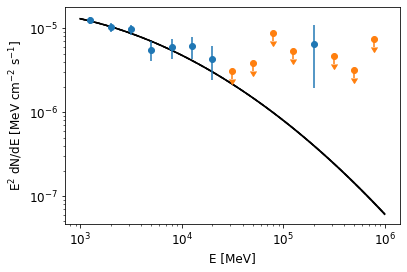

In [85]:
source_name = 'comp1'
result_name = 'fit_gammapy_template_comp1_and_comp2'
sed_comp1_fit_gammapy_template_comp1_and_comp2 = gta.sed(source_name)
plot_spectrum(result_name, sed_comp1_fit_gammapy_template_comp1_and_comp2, source_name)

2022-08-04 08:43:50 INFO    GTAnalysis.sed(): Computing SED for comp2
2022-08-04 08:43:51 INFO    GTAnalysis._make_sed(): Fitting SED
2022-08-04 08:43:51 INFO    GTAnalysis.free_source(): Fixing parameters for comp1                 : ['alpha', 'beta']
2022-08-04 08:43:51 INFO    GTAnalysis.free_source(): Fixing parameters for comp2                 : ['Index']
2022-08-04 08:44:10 INFO    GTAnalysis.sed(): Finished SED
2022-08-04 08:44:17 INFO    GTAnalysis.sed(): Execution time: 27.41 s


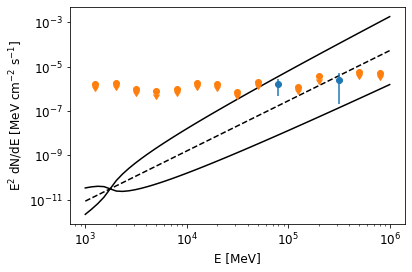

In [86]:
source_name = 'comp2'
result_name = 'fit_gammapy_template_comp1_and_comp2'
sed_comp2_fit_gammapy_template_comp1_and_comp2 = gta.sed(source_name)
plot_spectrum(result_name, sed_comp2_fit_gammapy_template_comp1_and_comp2, source_name)

In [87]:
sed_comp2_fit_gammapy_template_comp1_and_comp2['ts']

array([2.21073258e-01, 1.02998349e+00, 0.00000000e+00, 0.00000000e+00,
       8.90435054e-04, 1.53944752e+00, 4.68559330e-01, 0.00000000e+00,
       3.28751923e-01, 3.06503733e+00, 0.00000000e+00, 5.57542444e-02,
       2.35403733e+00, 0.00000000e+00, 0.00000000e+00])

In [88]:
gta.print_roi()

2022-08-04 08:44:18 INFO    GTAnalysis.print_roi(): 
name                SpatialModel   SpectrumType     offset        ts       npred
--------------------------------------------------------------------------------
comp1               SpatialMap     LogParabola       0.094    260.29      4791.5
comp2               SpatialMap     PowerLaw          0.181    -21.44        20.5
4FGL J1811.5-1925   PointSource    PowerLaw          0.268     59.28       839.7
4FGL J1808.8-1949c  PointSource    PowerLaw          0.537     65.34      1247.9
4FGL J1811.5-1844   PointSource    LogParabola       0.741    133.51      1662.0
4FGL J1808.2-2028e  RadialDisk     LogParabola       1.166    141.98      3024.0
4FGL J1818.1-2000   PointSource    LogParabola       1.921     85.66       520.1
4FGL J1813.1-1737e  RadialDisk     LogParabola       1.928   1436.46      9272.9
4FGL J1804.9-1745   PointSource    PowerLaw          2.109     50.86       532.9
4FGL J1806.2-2126   PointSource    LogParabola       2.2